## Exploration with Word Embedings (Deep Learning)
   
### CBOW
#### Model p(word | context)
#### Advantages: Smooths over distribution by averaging over all context words. This is helpful for small training sets.
####                        Also faster
   
<img src="./images/CBOW.png" width="300"> 

### Skipgram 
#### Model p(context | word) 
#### Advantage: Learns finer-grained vectors on large training data (i.e. better with infrequent words)

<tr>
    <td><img src="./images/Skip-Gram.png" alt="Drawing" style="width: 300px;"/></td>
    <td><img src="./images/skip_gram_net_arch.png" alt="Drawing" style="width: 500px;"/></td>
</tr>
    

## Environment Setup

#### First we will import some Python packages that we will use.

In [1]:
import re
import time
import numpy as np
import pandas as pd
import pickle as pkl
import nltk
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
import gensim
from gensim.models import Word2Vec
from gensim.models import Phrases
import sklearn
from sklearn.manifold import TSNE
%matplotlib inline 
import matplotlib.pyplot as plt

#from string import punctuation
#from sklearn.cluster import KMeans
#from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.metrics.pairwise import cosine_similarity
#from sklearn.manifold import MDS
#from gensim.models import Doc2Vec
#from gensim.models.doc2vec import LabeledSentence


D:\anaconda3\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


## More Environment Setup

#### We also need to load some nltk resources. These resources will help us clean the data.

In [2]:
# Text contains a lot of noisy words that are simply there to help with fluency.
nltk.download("stopwords")

# PUNKT is a tokenizer so that we can work with words and identify sentence boundaries.
nltk.download("punkt")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jferraro\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jferraro\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Syntactic NLP Processing

#### We want to coustomize tokenization so we have more control over our text and can remove unique textual forms of noise like dates, ages, etc.

In [12]:
def tokenize(text):
    sentence_list = [[sentence] for sentence in nltk.sent_tokenize(text)]
    tokenized_sentence_list = [nltk.word_tokenize(tokens) for sentence in sentence_list for tokens in sentence]
    filtered_sentence_list = []
    for tokenized_sentence in tokenized_sentence_list:
        filtered_sentence = []
        for token in tokenized_sentence:
            if (re.search('(^[a-zA-Z]+$)', token)):
                filtered_sentence.append(token)
        if filtered_sentence:
            filtered_sentence_list.append(filtered_sentence)        
    return filtered_sentence_list

## Retrieving our Corpus

#### Let's pull in our corpus that we had serialized out to disk.

In [4]:
file = open('differential-corpus.pkl','rb')
corpus = pkl.load(file)
file.close()
corpus.head()

,text,label
0,[**2996-12-2**] 10:25 AM\n CT CHEST W/O CONTRA...,PNA
1,[**3201-9-21**] 4:50 PM\n CT CHEST W/CONTRAST ...,PNA
2,[**3299-6-23**] 5:06 PM\n CT CHEST W/CONTRAST ...,PNA
3,[**3186-6-14**] 2:54 PM\n CT CHEST W/CONTRAST ...,PNA
4,[**2500-1-17**] 9:41 PM\n CT CHEST W/O CONTRAS...,PNA


## Data Structure Transformation

#### Let's build a dataframe so we can select case types easily.

In [112]:
df = pd.DataFrame(columns=('case', 'document', 'label'))
for case, document in corpus.items():
    if 'PNA' in case:
        df = df.append({'case': case, 'document': document, 'label': 'PNA'}, ignore_index=True)
    elif 'COPD' in case:
        df = df.append({'case': case, 'document': document, 'label': 'COPD'}, ignore_index=True)
    else: # CHF
        df = df.append({'case': case, 'document': document, 'label': 'CHF'}, ignore_index=True)       

## Building our Corpus

#### Using a data frame makes it easy to select between different cohorts.

In [13]:
df_pna = corpus.loc[corpus['label'] == 'PNA']

pneumonia_corpus = []
for index, row in df_pna.iterrows():
        document = row['text']
        document_sentences = tokenize(document)
        pneumonia_corpus.extend(document_sentences)
print(pneumonia_corpus)

[['AM', 'CT', 'CHEST', 'CONTRAST', 'Clip', 'Number', 'Radiology', 'Reason', 'please', 'eval', 'for', 'loculated', 'pleural', 'effusion', 'on', 'the', 'right', 'and', 'Field', 'of', 'view', 'UNDERLYING', 'MEDICAL', 'CONDITION', 'year', 'old', 'woman', 'with', 'RUL', 'subtotal', 'resection', 'for', 'lung', 'CA', 'as', 'well', 'as', 'a', 'LLL', 'superior', 'segment', 'resection', 'for', 'Tb', 'and', 'now', 'presents', 'a', 'RLL', 'PNA', 'and', 'parapneumonic', 'effusion', 'concerning', 'for', 'empyema', 'REASON', 'FOR', 'THIS', 'EXAMINATION', 'please', 'eval', 'for', 'loculated', 'pleural', 'effusion', 'on', 'the', 'right', 'and', 'place', 'a', 'pigtail', 'catheter', 'send', 'specimen', 'for', 'Gm', 'stain', 'AFB', 'smear', 'cytology', 'Fungal', 'culture', 'please', 'do', 'ASAP', 'as', 'pt', 'may', 'require', 'to', 'go', 'to', 'the', 'OR', 'later', 'this', 'afternoon', 'FINAL', 'REPORT', 'INDICATION', 'Location', 'US', 'HISTORY', 'OF', 'SUBTOTAL', 'RESECTION', 'FOR', 'LUNG', 'CANCER', 'IN

In [14]:
pneumonia_bigram_transformer = Phrases(pneumonia_corpus, min_count=20, threshold=5)

pneumonia_bigram_corpus = []
for sentence in pneumonia_corpus:
    pneumonia_bigram_corpus.append(pneumonia_bigram_transformer[sentence])


## Train a Word2Vec Model

#### Some hyperparameters that we can tune are:
####  - sg = 0 (CBOW) | 1 (Skip-Gram) 


In [15]:
%time pneumonia_model = Word2Vec(pneumonia_corpus, sg = 1, size = 300, window = 7, min_count = 5, workers = 5)

%time pneumonia_bigram_model = Word2Vec(pneumonia_bigram_corpus, sg = 1, size = 300, window = 7, min_count = 5, workers = 5)

Wall time: 1.89 s
Wall time: 1.59 s


## What does a Word2Vec model look like?

#### Vocabulary Size
#### Neurel Network Embedding Size
#### Learning Rate

In [16]:
print(pneumonia_model)

print(pneumonia_bigram_model)

Word2Vec(vocab=2225, size=300, alpha=0.025)
Word2Vec(vocab=2574, size=300, alpha=0.025)


## Accessing Word2Vec's Dictionary

#### Let's look at the Word2Vec dictionary by individual term and as a whole . . . 


In [17]:
print("* * * * * Term vector for inflitrate\n")
print(pneumonia_model.wv['infiltrate'], "\n\n")

print("* * * * * Dictionary of term vectors\n")
w2v = dict(zip(pneumonia_model.wv.index2word, pneumonia_model.wv.syn0))
for keys,values in w2v.items():
    print(keys)
    print(values)

* * * * * Term vector for inflitrate

[ 0.21825074 -0.0768987  -0.02446458  0.15232234  0.01102626  0.25268695
 -0.07934026  0.07537942  0.07728297  0.02488218 -0.02731982  0.29380256
  0.02212632  0.03658443  0.08963477 -0.03224412  0.11487868 -0.09236886
  0.10044532  0.0983259  -0.01841768 -0.20232834  0.07960421 -0.04184557
  0.0042341   0.03268736  0.20329043  0.03055683  0.04689126  0.20716876
  0.06504335 -0.2902642   0.06809942  0.06601565  0.05902454  0.05846571
 -0.13308458  0.32631484 -0.16047357  0.31269592 -0.07879677  0.33078766
  0.03826915  0.13049988 -0.03262008  0.0523267  -0.0322744  -0.16958876
  0.10081907  0.04343725  0.16912375 -0.0477658  -0.10018583 -0.15641505
  0.1329913  -0.06207848 -0.02575343 -0.01818182  0.03729075 -0.2884118
 -0.25861534  0.05288116 -0.13648428 -0.03427922 -0.0928439  -0.04347643
  0.05010198 -0.18146189  0.0584603  -0.06485801  0.10465865 -0.14248957
  0.28659442 -0.09172051 -0.21516377 -0.14944728  0.01571009 -0.0885572
  0.03624776 -0

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.wv.vectors instead).
  """


UNDERLYING
[ 1.91263501e-02 -3.26355487e-01  1.46123454e-01  1.43502802e-01
 -1.05783471e-03  3.41081589e-01 -2.66679972e-01  3.00534248e-01
  1.94700480e-01  1.31829813e-01 -1.92729101e-01  4.40035611e-01
  2.00642105e-02  2.96109051e-01  2.47507602e-01 -1.58378184e-01
  2.54227012e-01 -3.19161922e-01 -6.63478002e-02  2.75343478e-01
  3.33257556e-01 -6.24965370e-01  2.21865445e-01  1.99210927e-01
 -2.63923258e-01 -2.33128995e-01  4.36151735e-02  3.30280155e-01
  3.29607189e-01 -2.79924870e-01 -2.15207860e-01 -3.82244661e-02
  2.49237254e-01 -2.07693443e-01  2.03070328e-01  4.18066494e-02
 -2.67554313e-01  1.76300004e-01 -3.76168162e-01  7.16053665e-01
 -2.11448953e-01  4.45944428e-01 -3.52805436e-01  8.14891532e-02
 -1.26107901e-01  2.42703751e-01  1.89513177e-01 -4.93106157e-01
  1.85298501e-04  1.93361133e-01 -4.69618589e-02 -1.46031678e-01
 -3.27523202e-01 -7.77076483e-02  2.42514729e-01  2.14202106e-02
 -2.56419510e-01 -1.10459872e-01 -2.09370553e-01 -5.17227575e-02
 -1.32543430e-

 -6.52933493e-02 -1.06270418e-01 -2.22732320e-01 -1.60476584e-02]
lobes
[-4.25068885e-02 -1.64278001e-02 -7.30387494e-02  5.03520854e-02
 -9.26175267e-02  1.49550335e-02 -7.87527412e-02  1.10901438e-01
  2.31547251e-01  1.33978173e-01  8.56977180e-02  6.19236752e-02
 -1.06667019e-02  1.51185602e-01  1.08068876e-01  1.31761804e-01
 -6.34975880e-02 -1.58198297e-01 -1.66872159e-01  1.99829236e-01
  2.92472720e-01  2.84069534e-02 -3.67648341e-02  8.36982280e-02
  2.89626326e-02 -2.66552180e-01  1.72965586e-01  6.43648356e-02
  9.90941375e-02 -1.25034943e-01  3.31862494e-02 -5.51047623e-02
  7.41564482e-02  5.29455803e-02  1.11005202e-01 -1.44176468e-01
  1.80322856e-01  1.45894051e-01  9.96889099e-02  1.43949285e-01
 -5.31341098e-02 -9.95466337e-02  5.78761324e-02  2.12198675e-01
 -8.80628824e-02  1.07328527e-01 -8.12875777e-02 -1.10209785e-01
  2.00523555e-01 -9.71580073e-02 -1.70878738e-01  2.64814589e-02
  1.62923038e-01  6.00101128e-02 -1.06626935e-01  3.24996799e-01
 -1.81921832e-02  

Multiple
[-1.30193129e-01  2.03953147e-01  3.05673890e-02  2.31477380e-01
  2.66017169e-01 -5.01554489e-01 -2.93416058e-04  2.79847562e-01
  6.52511865e-02  1.39304072e-01  3.52060534e-02  1.14187583e-01
 -9.60186571e-02  4.09742951e-01  1.33098856e-01  4.75372940e-01
 -2.24611968e-01  2.60038823e-01  3.28905620e-02  1.17459126e-01
  3.84162635e-01 -1.09181870e-02  1.00280456e-01 -1.23243488e-01
  4.78963047e-04 -4.06352818e-01 -8.29744413e-02 -1.63113773e-01
  6.80865794e-02  2.45970681e-01 -8.86234269e-02  2.06522718e-01
 -1.10578462e-01 -6.16639704e-02 -1.22547157e-01 -4.35299546e-01
  4.09267191e-03  8.41537341e-02  7.33219981e-02 -1.63313821e-01
  1.67572126e-02 -1.68135568e-01 -6.75989985e-02 -3.69207382e-01
  8.39657113e-02 -2.33125523e-01  1.16102494e-01 -1.00625291e-01
  1.34913111e-02  1.37562647e-01  1.10946715e-01  2.53096931e-02
 -1.63671821e-01 -1.67319536e-01 -1.31086290e-01  2.93116104e-02
  1.46077856e-01 -1.26065537e-01  7.62896193e-03 -1.29694134e-01
  7.69484639e-02

 -5.52499667e-02  8.02580789e-02 -5.62192835e-02 -4.98715378e-02]
kidneys
[-2.10029513e-01  5.24331816e-02 -1.54812798e-01  1.20825842e-01
 -1.06971309e-01 -1.35960970e-02 -1.43366992e-01  2.50078857e-01
  1.33755684e-01  1.44243017e-02  3.36161666e-02 -1.50991902e-01
  2.76731979e-02  2.13211626e-01  2.82496810e-01  2.30514273e-01
 -1.50662497e-01 -1.45832449e-01 -4.51494567e-02  1.46833301e-01
  5.16668856e-01 -8.21594968e-02  2.00948879e-01 -1.28643677e-01
 -1.57996453e-02 -1.20743915e-01 -2.58757293e-01  8.85338560e-02
  1.84058532e-01  8.28310400e-02 -1.30185559e-01  4.40167308e-01
  1.39117707e-02 -3.48077603e-02  1.44304901e-01 -3.23538214e-01
 -9.43449995e-05 -2.23076910e-01 -4.60734516e-02  7.05401227e-02
  6.30704628e-04 -3.64766538e-01 -4.06991318e-02 -1.79946110e-01
  6.75678626e-02  1.95128210e-02  1.09275356e-01  2.10254580e-01
  1.82302445e-01  2.73425251e-01  1.30195722e-01 -1.90957248e-01
 -4.67455946e-02  1.02171570e-01 -8.60107541e-02 -8.97197705e-03
  8.83592591e-02

 -1.78612903e-01  9.32516381e-02 -3.22196305e-01 -2.08307192e-01]
paratracheal
[-1.23049036e-01  1.98248491e-01  2.01905340e-01  1.54006392e-01
  4.14423585e-01 -5.74343503e-01 -2.62888581e-01  5.11435866e-01
  9.91990045e-02  9.63941440e-02  1.57203019e-01 -3.06174289e-02
 -6.20792508e-02  3.38105053e-01 -3.96815389e-02  9.33541879e-02
  5.43058030e-02  2.17055287e-02 -1.13573938e-03 -9.33533069e-03
  3.47381145e-01  2.37808581e-02  2.40627322e-02 -2.41399114e-03
 -9.39800143e-02 -4.38581675e-01  3.16142179e-02  1.77410960e-01
  2.27393121e-01 -5.08522317e-02 -8.48480240e-02  1.61773376e-02
  3.02751921e-02 -7.82938525e-02 -1.43084392e-01  5.72553203e-02
  1.43594518e-01  6.46262094e-02  1.80369452e-01 -5.18112723e-03
  1.60934865e-01 -2.27812275e-01 -3.37146878e-01 -1.31925523e-01
 -2.98732966e-02 -1.28467619e-01  5.24790697e-02 -2.39305899e-01
  2.85676885e-02 -1.66370288e-01  5.92396110e-02 -8.35082531e-02
 -5.42469062e-02 -2.82329947e-01 -1.39868677e-01 -1.37093171e-01
  2.7152439

[-0.11341728  0.14264649  0.08892925  0.11724959  0.19147716 -0.50935405
 -0.20289935  0.33862117  0.09468114  0.04741694 -0.12755755 -0.07062718
 -0.09629433  0.17152575 -0.0766464   0.07152219 -0.08923315  0.13328384
  0.20063287  0.06750584  0.17926328  0.09659421  0.03606996 -0.07078348
  0.08276083 -0.24857536 -0.0830818   0.08126818  0.265404    0.25879642
 -0.25746953 -0.06104128  0.10832635 -0.15308738  0.00396746 -0.12699938
 -0.02681975  0.0205988  -0.04078487  0.34677836  0.00901286 -0.12168321
 -0.26787347 -0.25600606 -0.21370944 -0.10521925  0.23641363  0.06068576
  0.08970671 -0.12723069  0.05007678  0.03657793 -0.19825284 -0.19789359
 -0.26409653 -0.32211608  0.11324739  0.24081236 -0.09358131  0.05866586
 -0.12629169 -0.10790889  0.00369327 -0.08638948 -0.07955619  0.16161878
  0.02939133  0.2490536   0.12030809 -0.18017969  0.09503328  0.16687885
  0.11840716  0.02890528  0.14805616  0.05442353  0.2190179  -0.44795966
 -0.3739243   0.10509036  0.07349636  0.18090607  0

largest
[-1.82233438e-01  1.28494948e-01  1.50403664e-01  6.57660663e-02
  1.89346433e-01 -5.35385549e-01 -1.83824629e-01  3.43586534e-01
  1.34984106e-01  6.86389953e-02  5.33208251e-02 -3.55337118e-03
 -1.96898934e-02  2.63720095e-01 -2.83039063e-02 -2.19043368e-03
 -6.24146499e-03  3.28837335e-02 -6.57674810e-03 -5.15056215e-03
  2.91218579e-01  1.13439903e-01  3.20367068e-02 -3.12099885e-02
 -2.96522602e-02 -4.31279033e-01 -4.97516543e-02  1.63537130e-01
  2.92815447e-01 -1.09037377e-01 -1.09499380e-01  7.46845603e-02
  1.45540491e-01 -3.51550207e-02 -1.13983169e-01  1.47525202e-02
  1.75948199e-02 -3.21360677e-02  1.23006321e-01 -1.99701097e-02
  1.53861105e-01 -2.03861162e-01 -2.95323312e-01 -1.77000538e-01
 -6.78839758e-02 -1.17464490e-01  1.14084534e-01 -1.23268917e-01
 -6.21694997e-02  3.83707695e-02  7.98086375e-02 -7.28161484e-02
 -1.22658452e-02 -2.75120348e-01 -1.44464239e-01 -1.53389364e-01
  5.02536185e-02  2.45529547e-01 -4.38529849e-02  1.62629947e-01
  5.85390080e-05 

 -0.07566249 -0.01292503 -0.15001467 -0.12992543 -0.34440416  0.05729807]
fat
[-1.77302286e-01 -6.02241280e-03 -3.80035974e-02 -1.35036474e-02
 -8.20973292e-02 -1.99222833e-01 -8.43325183e-02  1.36367261e-01
  4.95360158e-02  5.58182374e-02 -6.43048063e-02 -1.87239096e-01
 -9.31207612e-02  1.23893403e-01  1.25584425e-04  9.99085158e-02
 -7.82270953e-02  7.94988722e-02  6.91348687e-03  1.43541366e-01
  1.52513981e-01 -5.08663654e-02  6.86310530e-02  1.07843339e-01
  1.53575148e-02 -9.20875892e-02 -1.40063586e-02 -2.87155323e-02
  1.42652720e-01  1.00272477e-01 -1.87336519e-01  6.23988211e-02
 -1.47247352e-02 -1.16186507e-01  1.25890285e-01 -2.60599554e-01
 -4.79330495e-02 -1.12347931e-01 -1.26741156e-01  1.55041352e-01
 -1.13748297e-01 -8.01744238e-02 -2.15276778e-01 -2.09886298e-01
 -1.49223909e-01  2.52778586e-02  2.20422596e-01  1.46660492e-01
  4.79781032e-02 -4.69616689e-02  2.70500295e-02  1.59770939e-02
 -1.43910408e-01 -1.61146484e-02 -2.18397036e-01 -6.52664304e-02
  2.16093987

 -0.11546761 -0.0563701  -0.20109433  0.00929547 -0.1085659   0.0510728 ]
Bibasilar
[-0.06554607 -0.04728313  0.01147766  0.09826408  0.03340874  0.03313011
 -0.12084615  0.2616451   0.11989561  0.08100969  0.11865566  0.01144963
 -0.02115441  0.20176974  0.18607901  0.17716813 -0.02616015  0.01745731
 -0.04567333  0.12083273  0.21490973 -0.0224525  -0.07382978 -0.06590828
  0.17762586 -0.12556787  0.23602034  0.10993481  0.08379833  0.17395975
 -0.06268948 -0.13804899 -0.08403949  0.02477649  0.16219027 -0.16200878
 -0.00730525  0.1137068   0.02336282  0.2692993  -0.08599021  0.05143373
 -0.13448924  0.02528834 -0.04136754  0.04237785  0.15438093 -0.00609621
  0.1238611  -0.11776417 -0.05659216  0.00275585  0.09441703  0.02032394
 -0.21146484  0.02046444  0.12494344  0.03766103  0.01886502 -0.18837894
 -0.26066226  0.00998179 -0.27055237 -0.10087943  0.08556299  0.02353054
 -0.06188317 -0.20322224 -0.13115168  0.0084984   0.02542684 -0.00883516
  0.18825391 -0.16451171 -0.01174869 -0.

 -0.13117677 -0.2691298  -0.23038688  0.18659282 -0.19120292 -0.10996499]
slice
[-5.26209772e-02  1.94715023e-01  5.88858910e-02  1.10354240e-03
  2.84371346e-01 -3.44448179e-01 -1.51970387e-01  3.18718016e-01
  1.53094968e-02  1.32720798e-01  1.51229501e-01 -2.48569489e-01
 -6.68882951e-02  2.82871515e-01  8.21506083e-02  2.73419440e-01
  1.01031154e-01 -1.37251288e-01 -1.74183130e-01  1.18627332e-01
  3.63981962e-01 -5.51251352e-01  2.09213838e-01  2.05129161e-01
 -2.28001624e-01 -7.87462145e-02  4.27434295e-02 -9.77200344e-02
  5.00158072e-02  1.24901190e-01 -1.28410906e-01  7.76970387e-02
 -2.85682917e-01 -1.91457644e-01  2.64055072e-03 -2.62377590e-01
  1.35266092e-02  7.91864619e-02 -1.04682647e-01 -7.09908158e-02
 -6.27107162e-04 -6.79000095e-02 -1.61609024e-01 -1.96653441e-01
 -1.70027148e-02  1.11521468e-01  6.44675940e-02 -1.15343265e-01
  5.69564477e-03 -1.24105565e-01  3.46763283e-01 -3.02204669e-01
 -1.63650513e-01 -7.66403554e-03 -1.69870034e-02 -5.06237429e-03
  1.347354

then
[-0.0472593   0.0947878  -0.03805229 -0.03792388  0.11574839 -0.19244337
 -0.08365317  0.14128265 -0.06318043  0.12349863  0.06806029 -0.15646997
  0.02043284  0.21787296  0.01064711  0.19349293  0.02032318  0.00918273
 -0.12243903  0.03480397  0.21599294 -0.33254117  0.12821464  0.20494097
 -0.13571645 -0.0522904   0.13418347 -0.11680689  0.04276476  0.09133853
 -0.1337083   0.03680595 -0.19729085 -0.1530107   0.04716293 -0.23457742
 -0.09396359  0.08729371 -0.16144949  0.04592503 -0.03899763  0.04573092
 -0.12146685 -0.14806046 -0.03341366  0.07992774  0.12172481 -0.03359206
 -0.06535964 -0.06213433  0.26179218 -0.19408624 -0.15791439 -0.02128125
 -0.04070513 -0.03561053  0.13129427 -0.02713785 -0.05642658  0.10708855
  0.18563819  0.11327471  0.15567909  0.00421131 -0.08064534  0.09997932
  0.11618177  0.06410709  0.05195505 -0.08420191  0.16718817 -0.03993002
  0.17372866 -0.20726499  0.19734518  0.19082513 -0.312647    0.06509521
 -0.1275633  -0.09591143  0.09945723 -0.043498

hila
[-0.15596499 -0.01221882 -0.00308218  0.04674911  0.0130125  -0.24598873
 -0.17892317  0.20061912  0.13838379  0.09046309 -0.00315812  0.00716574
  0.02366842  0.20989995  0.06259282  0.07708461 -0.05742327 -0.01885737
 -0.0600851   0.1001019   0.1978372   0.03629816  0.02084268  0.06704596
  0.0230503  -0.23735212 -0.00728402  0.05984752  0.2039464  -0.01939612
 -0.10866294  0.03403733  0.08242175 -0.03029435  0.08204519 -0.10147751
 -0.03867887 -0.03626523 -0.02077283  0.0961495   0.00658531 -0.11688261
 -0.17520861 -0.0886812  -0.04939206 -0.04360732  0.09853745  0.0095036
  0.01248774  0.05522132 -0.05698807 -0.02221461 -0.00550539 -0.0333331
 -0.15070216  0.01742101  0.06615561  0.05318926 -0.04009911  0.05960138
 -0.07295627  0.04593724  0.00063459 -0.03787032  0.01975394  0.1762421
 -0.04906037  0.01048445  0.03186471 -0.09955127  0.02626292  0.12751997
  0.00045269 -0.04056416  0.09223413  0.01615146  0.02931655 -0.07366957
 -0.05926303  0.0410408   0.11649549  0.08686733 

 -1.63441181e-01  3.97866070e-02 -7.43213370e-02 -1.02614379e-02]
granulomas
[-0.15836135 -0.01554089 -0.05348302  0.00226753 -0.0359733  -0.21087477
 -0.1360526   0.16014783  0.10142834  0.1251156  -0.047692   -0.02688129
 -0.06083278  0.18965358  0.00931421  0.12289667 -0.07322814  0.01146193
 -0.08492786  0.13542408  0.19166085 -0.01549962  0.08344412  0.09691737
 -0.00805906 -0.21339585  0.02994008 -0.05691565  0.15362406 -0.0214135
 -0.10802481  0.06944107  0.07781273 -0.05486781  0.0548621  -0.17367582
  0.02395541 -0.04101819 -0.04462052  0.02435384 -0.07083595 -0.10802673
 -0.11919073 -0.11173265 -0.0498913   0.01905631  0.10139084 -0.03429471
 -0.01629519  0.00982566 -0.05425489  0.00365504 -0.03575137 -0.05943468
 -0.14480379  0.12656552  0.10217098  0.00454874 -0.04372457  0.04535088
 -0.01674184  0.11567688  0.03226788 -0.09205119  0.01817334  0.13498987
  0.01736917  0.0579769   0.05840265 -0.13140881  0.04259694  0.11743759
  0.0247428   0.03655863  0.18534003  0.00683045

 -2.28690520e-01  7.89759308e-03 -1.09009556e-01  6.72351345e-02]
mL
[-9.78954043e-03  9.25150365e-02 -3.46928686e-02  1.85562335e-02
  9.74343494e-02 -1.46986589e-01 -6.41963854e-02  1.18496843e-01
 -6.91221803e-02  7.33088702e-02  1.03141457e-01 -1.53697714e-01
 -7.18400106e-02  1.57825083e-01  6.84299767e-02  1.98604748e-01
 -3.96902347e-03 -1.64893381e-02 -1.20580889e-01  6.62477314e-02
  1.74244165e-01 -3.66829216e-01  1.37088373e-01  1.61059335e-01
 -1.61487669e-01 -1.97681449e-02  1.36004776e-01 -9.40808579e-02
 -1.69465076e-02  1.61040664e-01 -1.38548523e-01  1.33624449e-02
 -2.05743432e-01 -1.85688466e-01  6.92476183e-02 -3.12265754e-01
 -8.49618018e-02  6.87120408e-02 -1.57047331e-01  8.28045085e-02
 -8.74584615e-02  8.19276497e-02 -1.18575983e-01 -8.87080953e-02
 -6.68171197e-02  1.17953181e-01  9.05668885e-02 -3.32026035e-02
  5.15059717e-02 -4.66856286e-02  2.06043169e-01 -1.46510422e-01
 -1.65993407e-01  1.84373732e-03 -6.52849078e-02  2.02730764e-03
  1.31911665e-01 -1.0

 -1.20696701e-01  4.35006618e-02 -8.60513672e-02 -1.29753143e-01]
Identifier
[ 0.08432952 -0.00227087  0.05240062  0.14131474  0.10124502  0.08487132
 -0.01099084  0.15643674  0.06571656  0.0159039   0.06699055  0.02104668
 -0.09785981  0.10879137  0.260134    0.18971574  0.07256587 -0.0901391
  0.00786309  0.13447054  0.17920233 -0.4152347   0.09954712 -0.07344197
  0.01725149  0.05825955  0.17888562  0.0028313  -0.04635815  0.26191926
 -0.08433641 -0.15672925 -0.12015498 -0.03729434  0.07089285 -0.19541177
 -0.08003075  0.19147895 -0.17129347  0.19144675 -0.14984335  0.22076024
 -0.06105852 -0.03761005 -0.07065783  0.06678212  0.08444788 -0.08966649
  0.06403839 -0.00946481  0.1713763  -0.11856176 -0.08244558 -0.07867929
  0.08766674 -0.10506296  0.04808093 -0.05652658  0.00466181 -0.10897548
 -0.1242583   0.02092168 -0.05319098 -0.05429797 -0.02796714 -0.08975962
  0.07188646 -0.18612573 -0.06380368 -0.11093581  0.09249703 -0.14101703
  0.27081382 -0.1927373  -0.05318366  0.08071868

ASTHMA
[ 1.31268231e-02 -2.21813336e-01  4.61767279e-02  1.60699457e-01
 -2.05216855e-02  2.01624110e-01 -1.32060364e-01  1.30649760e-01
  1.04157396e-01  1.17054150e-01  2.82471646e-02  2.03173265e-01
 -8.06155428e-02  1.41536415e-01  2.87874579e-01  4.20654789e-02
  1.34349257e-01 -1.41770005e-01  1.13706361e-03  1.55802727e-01
  2.02526256e-01 -4.15517449e-01  1.18343323e-01  1.16713308e-02
 -5.81558570e-02 -1.86582953e-02  1.56166509e-01  9.50523019e-02
  6.44469783e-02  1.28230462e-02 -7.78393075e-02 -1.04783989e-01
  5.20500913e-02 -9.81386006e-02  1.59347594e-01 -8.10895339e-02
 -1.70109987e-01  1.46020234e-01 -2.72122145e-01  2.79236019e-01
 -1.96805492e-01  2.42746338e-01 -8.56813788e-02 -9.96015035e-03
 -8.04768726e-02  1.09957434e-01  9.79619846e-02 -2.72250921e-01
 -4.53991927e-02  1.53444216e-01  1.12534836e-01 -1.15408607e-01
 -1.07429884e-01 -1.38422757e-01  2.13464096e-01  7.83240423e-02
  1.01092299e-02 -9.23880786e-02 -9.86058414e-02 -1.13496855e-01
 -1.07571699e-01  

 -1.34765983e-01 -6.76607788e-02 -1.95976049e-01 -1.24903321e-02]
correlated
[-0.09558718 -0.08546343 -0.06003288 -0.08054388 -0.02131212 -0.04867572
 -0.08064934  0.18322174  0.00521235  0.1424801  -0.06102027 -0.11059912
  0.02605743  0.2111144  -0.06665093  0.11541516 -0.0059746   0.06237786
 -0.1023498   0.07219768  0.22267148 -0.15125178  0.0812038   0.15794823
  0.07243851 -0.10978434  0.1890417  -0.04358749  0.1600224   0.01623183
 -0.13087    -0.05777297 -0.03540515 -0.07696358  0.04814097 -0.11943738
 -0.04885506  0.11336748 -0.10592873  0.23146081 -0.08998579  0.0532373
 -0.10859041 -0.11494748 -0.05355233  0.12265652  0.17240335  0.02695347
 -0.10624751 -0.1140997   0.04981054 -0.04805531 -0.13873604 -0.02414081
 -0.11365693  0.00091277  0.10540093 -0.0076952  -0.01204305  0.05146844
  0.0296742   0.00099596 -0.02023768 -0.00317307  0.01524243  0.06270011
  0.07298329  0.02658407 -0.0099213   0.02835714  0.06709296 -0.01947533
  0.14626104 -0.17700645  0.10161605  0.01199089

[ 0.11294655 -0.00205144 -0.01431726  0.03403675  0.07871654  0.09913529
 -0.02048446  0.14176331  0.00997293  0.05246219 -0.04294784  0.07840492
 -0.13748473  0.11704162  0.20948555  0.12276089 -0.0074612  -0.08757115
 -0.02633985  0.16868557  0.13831575 -0.30966368  0.11588581  0.01799523
  0.01222359  0.01876533  0.18550633 -0.01350998 -0.03257271  0.19100632
 -0.07070353 -0.12709883  0.00900013 -0.06585807  0.0317465  -0.15500607
 -0.02428038  0.15902638 -0.12745675  0.23013331 -0.15668967  0.18649933
 -0.1017077  -0.00241244 -0.13510467  0.08225139  0.06912021 -0.07672837
  0.0898445   0.03347288 -0.02011999 -0.09638032 -0.09920323 -0.06587158
  0.00905492 -0.01167271  0.01574029 -0.02903821  0.00962551 -0.10450707
 -0.10297524  0.12512799 -0.08228354 -0.10196614  0.08801769 -0.04290443
  0.15268472 -0.14911029 -0.02152321 -0.09926502  0.01768627  0.01722772
  0.21357249 -0.13895854 -0.05092328  0.02095995 -0.13044615 -0.06854416
  0.02405033 -0.12332852  0.15650958 -0.0456115   0

hemodynamic
[-6.01687953e-02 -2.48384941e-02  3.08740903e-02  8.77476670e-03
  7.90635415e-04 -1.82351857e-01 -1.09264277e-01  1.05708368e-01
  1.33924931e-01  2.37307884e-02 -4.98498119e-02  3.99707779e-02
 -5.54704666e-02  1.29644051e-01  7.57469907e-02  4.87075299e-02
  3.76343320e-04 -7.50071108e-02 -4.95163649e-02  1.07029572e-01
  1.28811479e-01 -1.19740576e-01  1.07239194e-01  5.22110648e-02
 -6.92923963e-02 -1.33434981e-01 -1.27235493e-02  1.35390982e-02
  1.21829122e-01  6.97360281e-03 -8.31592008e-02  2.96919961e-02
  9.10726339e-02 -8.70045573e-02  6.07832372e-02 -1.30960956e-01
 -6.51756972e-02 -1.50662418e-02 -9.54215229e-02  5.92132248e-02
 -2.82692909e-02 -2.19996758e-02 -1.02588303e-01 -6.92337975e-02
 -9.77404267e-02 -7.16938637e-03  5.93414456e-02 -4.74928096e-02
  1.94186959e-02  8.34238380e-02 -1.06230529e-03 -3.62163670e-02
 -8.84922817e-02 -7.44497627e-02 -3.41002978e-02  1.85875874e-02
  5.67771271e-02  8.97362549e-03 -6.97719604e-02  6.64998144e-02
 -2.98238620e

DATED
[ 9.88345519e-02  1.69955343e-02 -5.30949514e-03  8.97334740e-02
  8.85099694e-02 -2.69556767e-04 -9.98636335e-03  1.00287333e-01
 -2.17240117e-03 -1.45108420e-02  2.74608396e-02  6.35688305e-02
 -1.01417877e-01  1.37820199e-01  1.71775967e-01  1.31069213e-01
  4.85965684e-02 -4.15824130e-02  5.67066111e-03  4.30665947e-02
  1.62214115e-01 -2.87776291e-01  1.21794179e-01 -6.50456399e-02
 -4.23524641e-02 -1.29488604e-02  1.21459052e-01 -3.51331569e-02
 -3.16618942e-02  2.08252296e-01 -8.38364884e-02 -4.88160551e-02
 -4.26654443e-02 -1.16940737e-01  4.22645174e-02 -2.25096926e-01
 -1.02787867e-01  1.21071935e-01 -1.40274286e-01  1.47455171e-01
 -7.81899691e-02  1.47296309e-01 -5.51041253e-02 -5.30788302e-02
 -9.06376541e-02  3.46594229e-02  3.55541445e-02 -8.84102881e-02
  6.95853308e-02  1.01333112e-01  1.38016939e-01 -7.01438189e-02
 -1.58172488e-01 -1.31012052e-01  3.96461487e-02 -6.20017126e-02
  5.29800244e-02 -6.23365976e-02  3.09261754e-02 -1.13277085e-01
 -3.10858618e-02  8

f
[ 0.06890105 -0.12368099  0.00083718  0.09447502  0.03016439  0.0858925
 -0.14268701  0.15652446  0.03449533  0.08780803 -0.08834901  0.2349929
 -0.02600903  0.1275464   0.13618484 -0.00939157  0.06534781 -0.08904365
  0.03457626  0.10957362  0.14636318 -0.2552254   0.12168846  0.02789869
 -0.05656994 -0.09353139  0.09541979  0.05504502  0.12060878  0.06659137
 -0.09281202 -0.07924249  0.12361588 -0.10456222  0.08206583 -0.03550535
 -0.12487171  0.15541875 -0.17194131  0.2970943  -0.08738021  0.18101567
 -0.07020461  0.00626177 -0.10030888  0.06860881  0.03019525 -0.20213574
 -0.00456901  0.11620448  0.04180995 -0.05662066 -0.14441538 -0.11706474
  0.12445761 -0.009998   -0.03406266 -0.03414504 -0.04524904 -0.10967205
 -0.08495837  0.06694418 -0.01546549 -0.04057704 -0.01232477 -0.00431545
  0.12933666 -0.10815595  0.0386789  -0.08206263  0.0819957  -0.02729341
  0.1487338  -0.02683426 -0.16357037 -0.04409337 -0.07093951 -0.02560178
  0.03283687 -0.04623459  0.23802087  0.19125602  0

[ 0.0726188  -0.02651687 -0.01603029  0.03088984  0.05277474  0.07214434
 -0.05321226  0.11539948  0.01647327  0.06194947 -0.03010583  0.08368059
 -0.05144444  0.11342558  0.12668207  0.07474773  0.02323741 -0.08749799
 -0.03274641  0.12566261  0.10690934 -0.2410132   0.08129285  0.06953324
 -0.02371259 -0.01025014  0.11242568 -0.00512148  0.00967288  0.08595699
 -0.0415071  -0.08178306  0.00625358 -0.04366611  0.03857424 -0.06629968
 -0.02237256  0.11322323 -0.09793642  0.15252115 -0.09923907  0.13035809
 -0.10686323 -0.00744087 -0.06444324  0.06385466  0.03204028 -0.08670437
  0.03834263  0.03915635  0.01025379 -0.0776183  -0.0886254  -0.03699448
  0.03322923  0.01944108 -0.00649623 -0.03993963 -0.01342777 -0.0597011
 -0.05531183  0.08938164 -0.04391762 -0.05767736  0.03213986  0.00636827
  0.10179363 -0.13311696  0.01432815 -0.06624573  0.00147642  0.01638019
  0.13912883 -0.10005521 -0.03447964  0.03671888 -0.10043375 -0.02129492
  0.02872714 -0.06921011  0.14218037  0.04147002  0.

## Semantic Exploration of Words

#### What words are found in the same semantic context . . .

#### Let's look at a relationship . . . 
#####    Pneumonia disimular to CHF with infiltrate

In [18]:
print("bilateral")
print(pneumonia_model.most_similar(positive = ['bilateral'], topn=20), "\n")
print(pneumonia_bigram_model.most_similar(positive = ['bilateral'], topn=20))
print("\npneumonia")
print(pneumonia_model.most_similar(positive = ['pneumonia'], topn=20), "\n")
print(pneumonia_bigram_model.most_similar(positive = ['pneumonia'], topn=20))
print("\nNot pneumonia")
print(pneumonia_model.most_similar(negative = ['pneumonia'], topn=20), "\n")
print(pneumonia_bigram_model.most_similar(negative = ['pneumonia'], topn=20))
print("\nRelationship pneumonia disimular to CHF with infiltrate")
print(pneumonia_model.most_similar(positive=["pneumonia", "infiltrate"], negative=["chf"]), "\n")
print(pneumonia_bigram_model.most_similar(positive=["pneumonia", "infiltrate"], negative=["chf"]))

bilateral
[('Bilateral', 0.8287550210952759), ('bibasilar', 0.7944544553756714), ('atelectases', 0.7828673720359802), ('persist', 0.7728700637817383), ('Moderately', 0.7671103477478027), ('dependent', 0.7574143409729004), ('layer', 0.7559471726417542), ('Increased', 0.7543841004371643), ('Improving', 0.7507105469703674), ('Tiny', 0.7501181960105896), ('accompanied', 0.7484488487243652), ('reticular', 0.7430906295776367), ('Stable', 0.7417014837265015), ('nonhemorrhagic', 0.728641927242279), ('greater', 0.7284306287765503), ('peribronchovascular', 0.7259876132011414), ('plaques', 0.7218797206878662), ('Moderate', 0.7199642658233643), ('Widespread', 0.7132325172424316), ('sized', 0.7131626605987549)] 

[('alveolar', 0.8780211806297302), ('diffuse', 0.8749303817749023), ('Improving', 0.8528804779052734), ('emphysematous', 0.8513109683990479), ('airspace_opacities', 0.8449693918228149), ('multifocal', 0.8402042388916016), ('air_space', 0.8374766111373901), ('Severe', 0.8362349271774292), (

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  
D:\anaconda3\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated

In [19]:
print("Unigram (Opacities and Infiltrates): ", pneumonia_model.similarity("opacities", "infiltrates"))
print("Bigram (Opacities and Infiltrates): ", pneumonia_bigram_model.similarity("opacities", "infiltrates"))
print("Unigram (Effusions and Pneumonia)", pneumonia_model.similarity("effusions", "pneumonia"))
print("Bigram (Effusions and Pneumonia): ", pneumonia_bigram_model.similarity("effusions", "pneumonia"))

Unigram (Opacities and Infiltrates):  0.70224047
Bigram (Opacities and Infiltrates):  0.70130765
Unigram (Effusions and Pneumonia) 0.5083969
Bigram (Effusions and Pneumonia):  0.58912027


D:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  """Entry point for launching an IPython kernel.
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  after removing the cwd from sys.path.


## Semantic Data Visualization

#### Let's look at what words semantically travel together . . .

In [20]:
def plot_embeddings(w2v_model, vocabulary):
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    
    # Get the term vectors out of the model for the specified vocabulary
    term_vectors = []
    for term in vocabulary:
        if term in w2v_model.wv.vocab:
            term_vectors.append(w2v_model[term])
    Y = tsne.fit_transform(term_vectors)
    
    # let's make this plot a decent size...
    # Get current size
    fig_size = plt.rcParams["figure.figsize"]
    # Set figure width and height
    fig_size[0] = 15
    fig_size[1] = 35
    plt.rcParams["figure.figsize"] = fig_size
 
    plt.scatter(Y[:, 0], Y[:, 1])
    for label, x, y in zip(vocabulary, Y[:, 0], Y[:, 1]):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.show()
    


#### Visualize Unigram Model

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


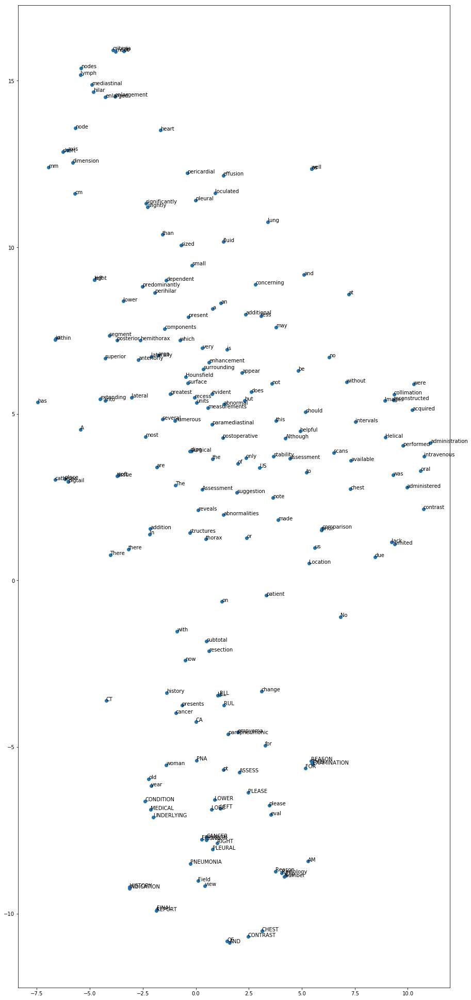

In [21]:
pneumonia_vocab = [k for (k, v) in pneumonia_model.wv.vocab.items()]
plot_embeddings(pneumonia_model, pneumonia_vocab[:200])

#### Visualize Partial Bigram Model

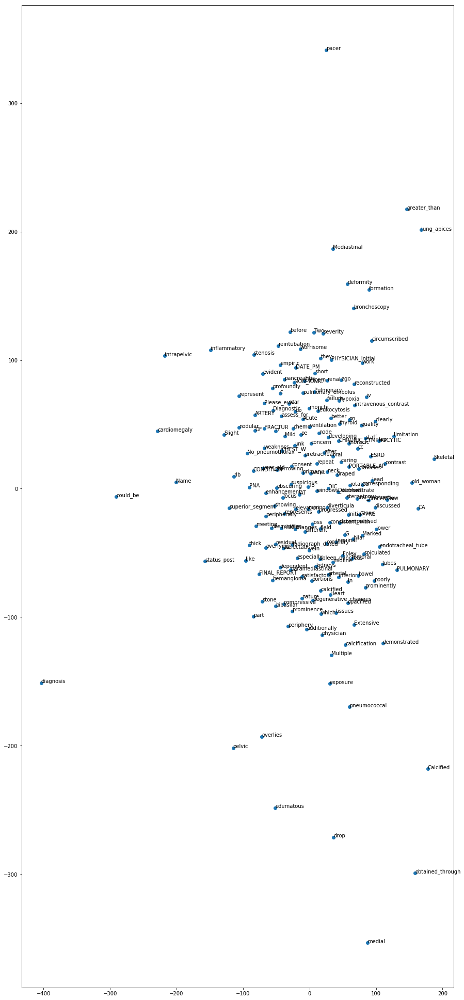

In [145]:
pneumonia_vocab = [k for (k, v) in pneumonia_bigram_model.wv.vocab.items()]
plot_embeddings(pneumonia_bigram_model, pneumonia_vocab[:200])